In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def initial_condition(x, kind="sine"):
    if kind == "sine":
        return np.sin(np.pi * x)
    if kind == "chopped":
        y = np.sin(np.pi * x)
        y[x > 0.5] = 0.0
        return y
    raise ValueError("Unknown kind")

def solve_wave_1d(L=1.0, c=1.0, N=400, dt=1e-3, T=1.0, ic_kind="sine"):
    dx = L / N
    r = c * dt / dx
    if r > 1.0:
        raise ValueError(f"Unstable: c*dt/dx = {r:.3f} > 1.")

    x = np.linspace(0.0, L, N + 1)

    # Psi^0
    psi = initial_condition(x, kind=ic_kind)
    psi[0] = 0.0
    psi[-1] = 0.0

    # First step Psi^1 
    lap0 = (psi[2:] - 2.0 * psi[1:-1] + psi[:-2])
    psi_next = psi.copy()
    psi_next[1:-1] = psi[1:-1] + 0.5 * (r**2) * lap0
    psi_next[0] = 0.0
    psi_next[-1] = 0.0

    psi_prev = psi
    psi = psi_next

    n_steps = int(np.round(T / dt))

    save_every = max(1, n_steps // 400)
    snapshots = [psi_prev.copy(), psi.copy()]
    times = [0.0, dt]

    for n in range(1, n_steps):
        # Interior update
        lap = (psi[2:] - 2.0 * psi[1:-1] + psi[:-2])
        psi_new = np.empty_like(psi)
        psi_new[1:-1] = 2.0 * psi[1:-1] - psi_prev[1:-1] + (r**2) * lap

        # Fixed boundaries
        psi_new[0] = 0.0
        psi_new[-1] = 0.0

        psi_prev, psi = psi, psi_new

        if (n + 1) % save_every == 0:
            snapshots.append(psi.copy())
            times.append((n + 1) * dt)

    return x, np.array(times), snapshots

In [ ]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation


def plot_overlays(x, times, snapshots, pick_times):
    # pick_times: list of times you want to plot
    # Find closest saved snapshot for each requested time
    plt.figure()
    for t in pick_times:
        idx = int(np.argmin(np.abs(times - t)))
        plt.plot(x, snapshots[idx], label=f"t≈{times[idx]:.3f}")
    plt.xlabel("x")
    plt.ylabel("Psi(x,t)")
    plt.title("Wave equation snapshots")
    plt.legend()
    plt.tight_layout()
    plt.show()

def animate_solution(x, times, snapshots, interval_ms=30):
    fig, ax = plt.subplots()
    line, = ax.plot(x, snapshots[0])
    ax.set_xlim(x[0], x[-1])

    all_min = min(s.min() for s in snapshots)
    all_max = max(s.max() for s in snapshots)
    pad = 0.1 * (all_max - all_min + 1e-12)
    ax.set_ylim(all_min - pad, all_max + pad)

    ax.set_xlabel("x")
    ax.set_ylabel("Psi")
    title = ax.set_title(f"t = {times[0]:.3f}")

    def update(frame):
        line.set_ydata(snapshots[frame])
        title.set_text(f"t = {times[frame]:.3f}")
        return line, title

    anim = FuncAnimation(fig, update, frames=len(snapshots), interval=interval_ms, blit=False)
    plt.tight_layout()
    return anim

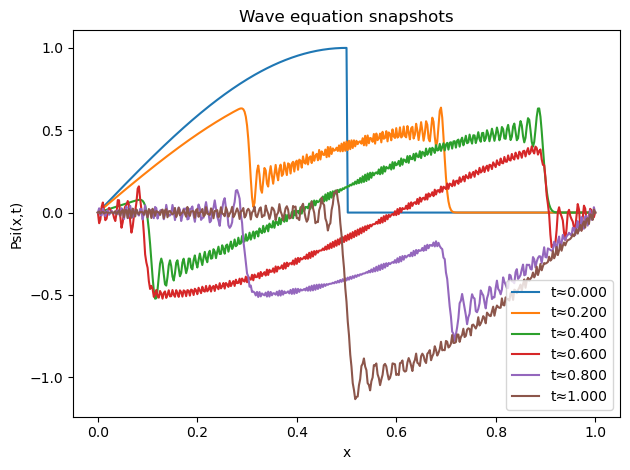

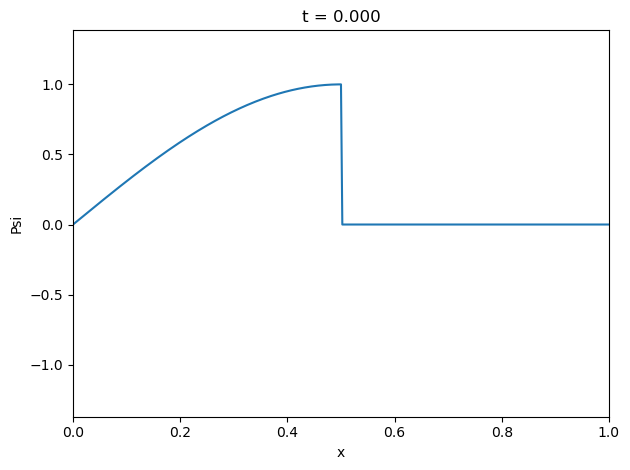

In [6]:
L = 1.0
c = 1.0
dt = 1e-3
T = 2.0
N = 400

# Choose initial condition: "sine" or "chopped"
ic_kind = "chopped"

x, times, snapshots = solve_wave_1d(L=L, c=c, N=N, dt=dt, T=T, ic_kind=ic_kind)

# (B) overlay a few times
plot_overlays(x, times, snapshots, pick_times=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0])

# (C) animation
anim = animate_solution(x, times, snapshots, interval_ms=5)
HTML(anim.to_jshtml())
